# **Mastering Principal Component Analysis (PCA) for Dimensionality Reduction**






##**1.Introduction**

Principal Component Analysis (PCA) is a widely used machine learning technique for dimensionality reduction, offering a solution to handle datasets with high-dimensional features. By reducing dimensions, PCA enables better data visualization, removes redundant information, and reduces computational costs, while preserving the most significant information. This tutorial uses the Seeds dataset to demonstrate PCA's effectiveness, explaining how to reduce data dimensions and visualize high-dimensional data in two dimensions.

##**2.Objective**

This tutorial aims to:

1.   Understand the working mechanism and advantages of PCA.
2.   Apply PCA to reduce dimensions of the Seeds dataset from 7 to 2 dimensions.
3.   Visualize the original dataset and PCA-transformed dataset side by side.
4.   Interpret the variance captured by the principal components.


##**3.Why PCA?**

PCA is a powerful technique for the following reasons:

*   Dimensionality Reduction: PCA reduces the number of features in a dataset
    simplifying analysis and visualization while retaining significant data variability.
    
*   Improved Visualization: With PCA, high-dimensional data can be visualized in 2D or 3D, aiding in better understanding and communication of results.

*   Handling Multicollinearity: PCA transforms correlated features into
    uncorrelated principal components.

*   Reduced Computational Complexity: By focusing on fewer features, PCA speeds
    up training and inference in machine learning models.

*   Feature Extraction: PCA identifies the most influential components in the
    dataset, providing insights into the data structure.
















##**4.How PCA Achieves Dimensionality Reduction**

####**1.Standardization**

Before applying PCA, the dataset is standardized to give equal weight to all features. This step ensures that features with larger ranges do not dominate the principal components.

                            Formula for Standardization:
                                 z = (x - μ) / σ


                    

Where:


z: Standardized value

x: Original value

μ: Mean of the feature

σ: Standard deviation of the feature

####**2.Covariance Matrix Calculation**

The covariance matrix captures the relationships between features. It shows how changes in one feature are associated with changes in another.

                           Cov(X) = (1 / (n - 1)) * (Xᵀ * X)

                   Covariance Between Two Variables (Individual Pair):         
                Cov(X1, X2) = (1 / (n - 1)) * Σ [ (x1_i - x̄1) * (x2_i - x̄2) ]

Where:

Cov(X): Covariance matrix

X: Standardized data matrix

n: Number of observations

Xᵀ: Transpose of the data matrix

####**3.Eigen Decomposition**

PCA computes the eigenvalues and eigenvectors of the covariance matrix:

Eigenvalues: Indicate the amount of variance explained by each eigenvector.

Eigenvectors: Define the directions of the principal components.

                                  C * v = λ * v

Where:

C: Covariance matrix

v: Eigenvector

λ: Eigenvalue

####**4.Principal Component Selection**

Eigenvectors are sorted by their eigenvalues in descending order. The top
k eigenvectors (based on their eigenvalues) are chosen as the principal components.

                                  
####**5.Transformation**

The dataset is projected onto the new space defined by the principal components:

                                Z = X * W

Z = Transformed Data

X = Standardized data

W = Matrix of principal components  (eigenvectors)

##**5.Visual Geometric Explanation of PCA**

Before diving into the detailed application of PCA on the Seeds dataset, let's start with a small example to understand the geometric intuition behind PCA. This will help you grasp how PCA identifies the directions (principal components) where the data varies the most and projects it onto these directions for easier analysis.

**Concept**

PCA computes new axes (principal components) based on data variance.

First Principal Component (PC1): Captures the maximum variance.

Second Principal Component (PC2): Orthogonal to PC1 and captures the remaining variance.

The data is rotated to align with these axes, making it easier to analyze.

**Visualization**

Below is an animated visualization of PCA, showing how data points rotate and align with principal components:

Mock dataset created and standardized.
Explained Variance Ratio: [0.51825852 0.48174148]


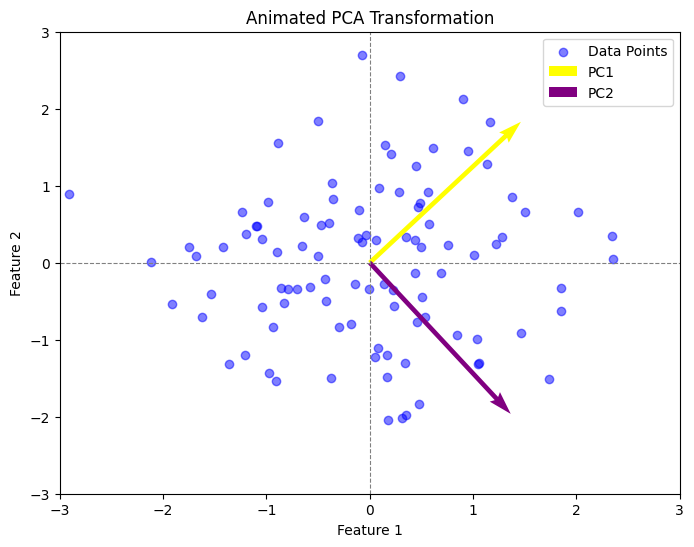

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Create a mock dataset for PCA visualization using 'make_blobs'
# The dataset consists of 100 samples, clustered at one center

X, _ = make_blobs(n_samples=100, centers=1, cluster_std=2, random_state=42)

# Standardizing the dataset to have zero mean and unit variance for PCA
X = StandardScaler().fit_transform(X)

# Display a message for screen readers explaining the purpose
print("Mock dataset created and standardized.")

# Apply PCA to reduce the dimensionality of the data to 2 components
pca = PCA(n_components=2)
pca.fit(X)

# Extract the principal components and the mean of the dataset
components = pca.components_
mean = pca.mean_

# Print the explained variance of the components for clarity (good for accessibility)
print(f"Explained Variance Ratio: {pca.explained_variance_ratio_}")

# Create a rotation matrix for animation
def rotation_matrix(angle):
  # Convert angle to radians
    theta = np.radians(angle)
    # Return the 2D rotation matrix
    return np.array([[np.cos(theta), -np.sin(theta)],
                     [np.sin(theta), np.cos(theta)]])

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(X[:, 0], X[:, 1], alpha=0.5, label="Data Points",color='blue')
# quivers with annotations for PC1 and PC2
quiver1 = ax.quiver(*mean, *components[0], color='yellow', scale=3, label='PC1')
quiver2 = ax.quiver(*mean, *components[1], color='purple', scale=3, label='PC2')

# Set axis limits
ax.set_xlim(-3, 3)
ax.set_ylim(-3, 3)
ax.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)
sns.set_palette("colorblind")
ax.set_title("Animated PCA Transformation")
ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")
ax.legend()


# Animation update function
def update(frame):
    angle = frame  # Angle of rotation in degrees
    R = rotation_matrix(angle)
    rotated_X = X @ R.T
    scatter.set_offsets(rotated_X)

    # Update quivers (principal components)
    rotated_component1 = R @ components[0]
    rotated_component2 = R @ components[1]
    quiver1.set_UVC(*rotated_component1)
    quiver2.set_UVC(*rotated_component2)
    return scatter, quiver1, quiver2

# Create animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Save the animation as a .gif or .mp4 file
ani.save('pca_animation.gif', writer='imagemagick', fps=30)  # Save as .gif

# Display the saved animation
from IPython.display import Image
Image(filename='pca_animation.gif')

# Display animation in notebook
HTML(ani.to_jshtml())

# Alt-text: "An animated plot showing the PCA transformation. The dataset points rotate, and the two principal components (PC1 and PC2) are updated in each frame of the animation."


**Output Detail:**

Scatter plot of data points in blue, illustrating the PCA transformation. The yellow arrow represents the first principal component (PC1), pointing in the direction of maximum variance, while the violet arrow represents the second principal component (PC2), orthogonal to PC1. The data is symmetrically distributed around the origin with axes labeled as Feature 1 and Feature 2



##**6.Dataset Description**

The Seeds dataset, sourced from the UCI Machine Learning Repository, contains measurements of wheat kernels across three classes: Kama, Rosa, and Canadian.

Features(7):

Area,Perimeter,Compactness,Kernel length,Kernel width,Asymmetry coefficient
Groove length

Target Variable: Wheat seed type (3 classes).

Dataset Size: 210 instances.


##**7. Applying PCA with Python**

With the foundational understanding in place, we’ll now apply PCA step by step to the Seeds dataset. This section demonstrates how to preprocess the data, perform PCA, and visualize the results in a detailed, systematic manner.



**Step 1: Import Required Libraries**

In [32]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

**Step 2: Load the Dataset**

In [33]:

# URL of the Seeds dataset
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00236/seeds_dataset.txt"

# Define column names
column_names = ['Area', 'Perimeter', 'Compactness', 'Length', 'Width', 'Asymmetry', 'Groove', 'Class']

# Load the dataset with corrected delimiter handling
data = pd.read_csv(url, sep='\s+', names=column_names)

# Display the first few rows to verify
print(data.head())

    Area  Perimeter  Compactness  Length  Width  Asymmetry  Groove  Class
0  15.26      14.84       0.8710   5.763  3.312      2.221   5.220      1
1  14.88      14.57       0.8811   5.554  3.333      1.018   4.956      1
2  14.29      14.09       0.9050   5.291  3.337      2.699   4.825      1
3  13.84      13.94       0.8955   5.324  3.379      2.259   4.805      1
4  16.14      14.99       0.9034   5.658  3.562      1.355   5.175      1



**Step 3: Standardize the Data**

PCA works best when features are standardized to have a mean of 0 and a standard deviation of 1. This ensures all features contribute equally.

In [34]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
# Separate features and target
X = data.drop('Class', axis=1)
y = data['Class']
X_scaled = scaler.fit_transform(X)

**Step 4: Apply PCA**

Now, we apply PCA to reduce the dimensionality of the dataset from 7 dimensions to 2 principal components.

In [35]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_
print(f"Explained Variance Ratio: {explained_variance}")

Explained Variance Ratio: [0.71874303 0.17108184]


**Result:**

Principal Component 1 captures 71.87% of the variance.

Principal Component 2 captures 17.11% of the variance.

Together, they capture 89% of the total variance.

**Step 5: Visualize the PCA Results**

1.Original Data Visualization (Feature Space)

To compare with PCA, we visualize the original dataset using two features: Area and Perimeter.




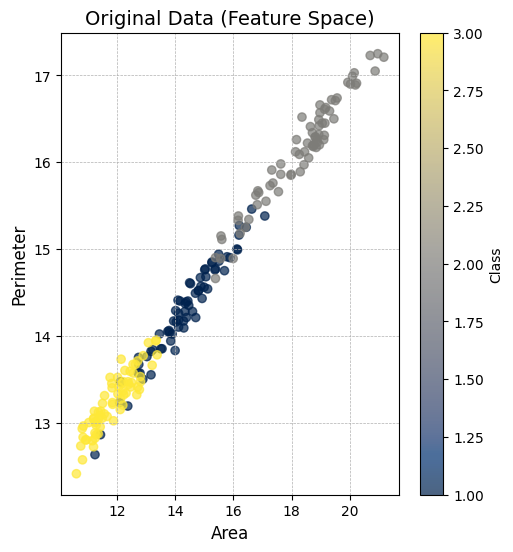

In [36]:
# First plot: Original Data (Feature Space)
plt.figure(figsize=(12, 6))

# Subplot 1: Scatter plot in feature space with accessible colors and grid lines
plt.subplot(1, 2, 1)
plt.scatter(X['Area'], X['Perimeter'], c=y, cmap='cividis', alpha=0.7)
plt.colorbar(label='Class')  # Colorbar with label for the class
plt.title('Original Data (Feature Space)', fontsize=14)
plt.xlabel('Area', fontsize=12)
plt.ylabel('Perimeter', fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Adding grid lines for better readability
plt.show()

# Alt-text for this plot:
# "Scatter plot showing the original data in feature space. The x-axis represents Area, and the y-axis represents Perimeter. The points are colored based on the class label, with a colorbar to indicate the class."





**Output Overview:**

A scatter plot titled 'Original Data (Feature Space)' shows data points representing the relationship between 'Area' (x-axis) and 'Perimeter' (y-axis). The data points are color-coded based on a 'Class' variable, with a color bar on the right ranging from blue (1.00) to yellow (3.00). The plot shows a clear linear trend where the perimeter increases with the area. The points are clustered into three distinct color groups, indicating different classes."

2.PCA-Transformed Data Visualization

Now, we visualize the PCA-transformed data in terms of the first two principal components.

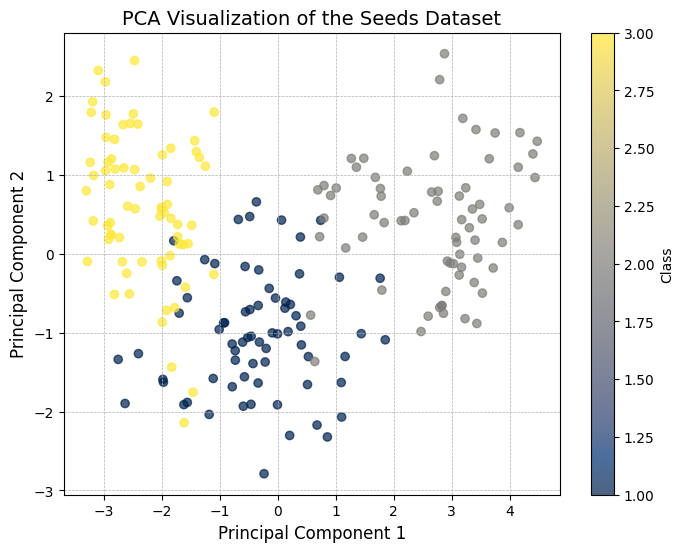

In [37]:
# Second plot: PCA Visualization
plt.figure(figsize=(8, 6))

# Scatter plot after applying PCA
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='cividis', alpha=0.7)  # Color-blind friendly colormap
plt.colorbar(label='Class')  # Colorbar with label for the class
plt.title('PCA Visualization of the Seeds Dataset', fontsize=14)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Adding grid lines for better readability

# Alt-text for this plot:
# "Scatter plot showing the PCA transformation of the seeds dataset. The x-axis represents Principal Component 1, and the y-axis represents Principal Component 2. Points are colored based on class labels, with a colorbar indicating the class."

# Show the plots
plt.show()

**Output Overview:**

A scatter plot titled 'PCA Visualization of the Seeds Dataset' showing data points colored by class. The x-axis is labeled 'Principal Component 1' and the y-axis is labeled 'Principal Component 2'. A color bar on the right ranges from 1.00 (dark blue) to 3.00 (yellow), indicating different classes.

**Step 6: Variance Explained by Principal Components**

Visualize the variance explained by each principal component to understand how well PCA captures the data.

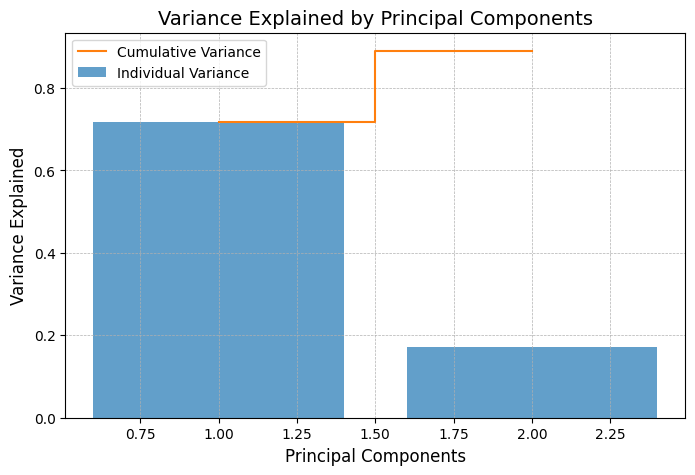

In [38]:
# Variance explained by each component
explained_variance = pca.explained_variance_ratio_

# Cumulative variance
cumulative_variance = np.cumsum(explained_variance)

# Plotting individual variance explained
plt.figure(figsize=(8, 5))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, color='tab:blue', label='Individual Variance')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', color='tab:orange', label='Cumulative Variance')

# Labels, title, and legend
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Variance Explained', fontsize=12)
plt.title('Variance Explained by Principal Components', fontsize=14)
plt.legend()

# Grid lines to make the plot easier to interpret visually
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Alt-text for the plot:
# "Bar plot showing the variance explained by each principal component. A line shows the cumulative variance, demonstrating how much of the total variance is explained as more components are included."

# Show the plot
plt.show()

Output Overview:

A bar and line graph titled 'Variance Explained by Principal Components.' The x-axis is labeled 'Principal Components' and ranges from 0.75 to 2.25. The y-axis is labeled 'Variance Explained' and ranges from 0.0 to 0.8. The graph shows two principal components. The first principal component explains 71.87% of the variance, and the second principal component explains 17.11% of the variance. The line graph shows the cumulative variance retained as more components are added.  The legend indicates that the blue bars represent 'Individual Variance' and the orange line represents 'Cumulative Variance



**Step 7: Important Metrics for Evaluating PCA**

Explained Variance Ratio:
Indicates how much variance is retained by the principal components. A high value (e.g., >80%) justifies dimensionality reduction.



In [39]:
# Total explained variance
total_variance = sum(explained_variance)
print(f"Total Variance Explained by 2 Components: {total_variance:.2f}")

Total Variance Explained by 2 Components: 0.89


##**8.Interactive Visualization of Variance Explained**

After applying PCA to the Seeds dataset, it is essential to understand how well the principal components capture the variability in the data. This interactive visualization will help to explore the trade-off between the number of principal components and the amount of variance retained.

To make this tutorial more engaging, I have introduced an interactive tool where you can adjust the number of components and observe how much variance is retained.

The interactive widget allows users to adjust the number of principal components (n_components) and observe its impact on variance retention. Increasing n_components adds more components to the PCA-transformed dataset, capturing more variance. The cumulative variance plot helps determine the optimal number of components needed for dimensionality reduction without significant information loss.

In [41]:
from ipywidgets import interact

# Interactive function to plot variance explained with an adjustable number of components
def plot_pca_components(n_components):
    # Fit PCA with the selected number of components
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)  # Assuming X_scaled is the scaled input data
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)

    # Create the plot
    plt.figure(figsize=(8, 5))

    # Bar plot for individual variance
    plt.bar(range(1, n_components + 1), explained_variance, alpha=0.7, align='center', color='tab:blue', label='Individual Variance')

    # Cumulative variance line
    plt.step(range(1, n_components + 1), cumulative_variance, where='mid', label='Cumulative Variance', color='tab:orange')

    # Labels and title
    plt.xlabel('Principal Components', fontsize=12)
    plt.ylabel('Variance Explained', fontsize=12)
    plt.title(f'PCA with {n_components} Components', fontsize=14)

    # Adding grid lines for better visibility
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

    # Adding a legend to explain the components
    plt.legend(loc='best')

    # Show the plot
    plt.show()


# Widget interaction for selecting the number of components
interact(plot_pca_components, n_components=(1, X.shape[1]))  # Assuming X.shape[1] gives the number of features

# Alt-text for the interactive plot:
# "Interactive plot allowing users to select the number of principal components to observe the variance explained by each component and the cumulative variance."

# Additional message for clarity
print("Adjust 'n_components' to observe how additional components affect variance explained.")

interactive(children=(IntSlider(value=4, description='n_components', max=7, min=1), Output()), _dom_classes=('…

Adjust 'n_components' to observe how additional components affect variance explained.


##**Advanced PCA: Robust Variance Estimation**

In our analysis, we observed that standard PCA provided a cumulative variance of 89% explained by the first two components. This result highlights the dimensionality reduction potential of PCA but does not address the reliability or variability of these findings across different data samples.
To bridge this gap, we introduced Advanced PCA with Bootstrapping, which extends the basic analysis by testing its robustness.

By repeatedly sampling the dataset and recalculating the variance explained, the advanced method provides:

###Statistical Robustness:

The total variance explained across all components was 100%, affirming that PCA retains all variance in the dataset when no components are discarded.

###Cumulative Variance:

Advanced PCA demonstrated how variance accumulates across components with confidence intervals, adding reliability to the interpretation.

**Let's go deeper into bootstrapping and working of the code.**

What is Bootstrapping?
Bootstrapping is a statistical technique used to estimate the variability or uncertainty of a model by repeatedly sampling data with replacement. In this context, we use bootstrapping to evaluate the reliability of the variance explained by the principal components in PCA.


**How Does the Code Work?**

Here's a step-by-step breakdown of the bootstrapping process:

###Random Sampling with Replacement:
The dataset is repeatedly resampled. Each "bootstrap sample" is the same size as the original dataset but may include duplicate rows.

###Perform PCA on Each Sample:
For every bootstrap sample, PCA is applied, and the variance explained by each component is recorded.

###Calculate Statistics:
Across all bootstrap samples, we compute:

The mean explained variance for each principal component.
The standard deviation, which measures the variability of explained variance.
Confidence intervals (e.g., 95%) to capture the range of possible values.



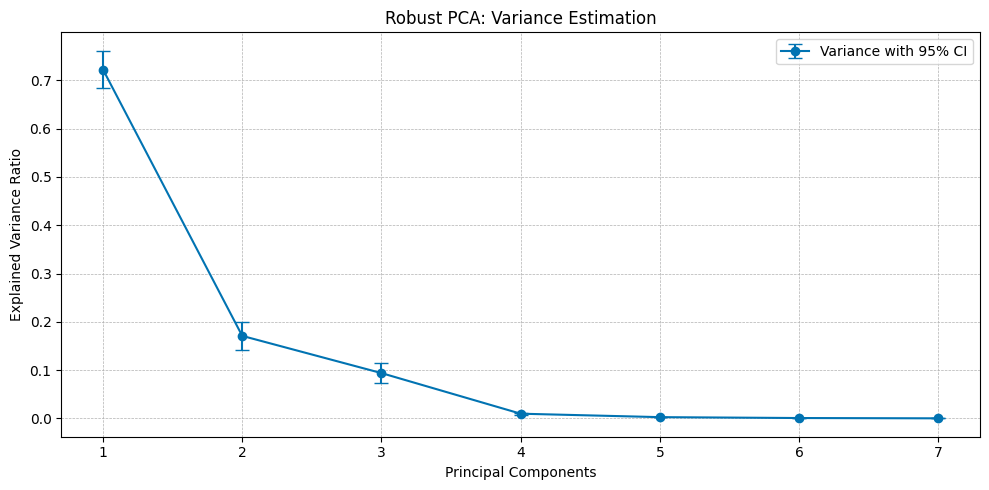

Total Variance Explained: 1.0
Cumulative Variance: [0.72224909 0.89307984 0.98685968 0.99656998 0.99914697 0.99988539
 1.        ]


In [42]:
def advanced_pca_analysis(X_scaled, n_bootstraps=100):
    """
    Perform robust PCA analysis with bootstrapping and information theory

    Args:
        X_scaled (numpy.ndarray): Standardized input data
        n_bootstraps (int): Number of bootstrap iterations

    Returns:
        dict: Advanced PCA analysis results
    """
    # Store bootstrap variance results
    bootstrap_variances = []

    # Perform bootstrapped PCA
    for _ in range(n_bootstraps):
        # Bootstrap sampling
        sample_indices = np.random.randint(0, X_scaled.shape[0], X_scaled.shape[0])
        bootstrap_sample = X_scaled[sample_indices]

        # Perform PCA on bootstrap sample
        pca = PCA()
        pca.fit(bootstrap_sample)
        bootstrap_variances.append(pca.explained_variance_ratio_)

    # Convert to numpy array for calculation
    bootstrap_variances = np.array(bootstrap_variances)

    # Calculate robust statistics
    variance_mean = np.mean(bootstrap_variances, axis=0)
    variance_std = np.std(bootstrap_variances, axis=0)

    # Confidence intervals (95%)
    ci_lower = variance_mean - 1.96 * variance_std
    ci_upper = variance_mean + 1.96 * variance_std

    # Perform full PCA on original data
    full_pca = PCA()
    full_pca.fit(X_scaled)

    # Visualization of robust variance
    plt.figure(figsize=(10, 5))
    plt.errorbar(
        range(1, len(variance_mean) + 1),
        variance_mean,
        yerr=[variance_mean - ci_lower, ci_upper - variance_mean],
        fmt='o-',
        capsize=5,
        label='Variance with 95% CI'
    )
    plt.title('Robust PCA: Variance Estimation')
    # Adding grid lines for better visibility
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xlabel('Principal Components')
    plt.ylabel('Explained Variance Ratio')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Return comprehensive analysis results
    return {
        'bootstrap_mean_variance': variance_mean,
        'bootstrap_variance_std': variance_std,
        'confidence_interval_lower': ci_lower,
        'confidence_interval_upper': ci_upper,
        'cumulative_variance': np.cumsum(variance_mean),
        'total_variance_explained': np.sum(variance_mean)
    }

# Perform advanced PCA analysis
advanced_results = advanced_pca_analysis(X_scaled)
print("Total Variance Explained:", advanced_results['total_variance_explained'])
print("Cumulative Variance:", advanced_results['cumulative_variance'])

**Real-World Applications and Limitations**

**Applications**


*   Face Recognition: PCA reduces dimensionality of image data.
*   Genomics: Identifies patterns in high-dimensional genetic data.
*   Finance: Extracts latent factors from correlated financial metrics.


**Limitations**


*   PCA assumes linearity and may struggle with non-linear data.
*   Sensitive to scaling; requires standardization.
*   Principal components may not have direct interpretability.


**References**

GeeksforGeeks (2024) *Principal Component Analysis(PCA)*. (Available at:https://www.geeksforgeeks.org/principal-component-analysis-pca/) [Accessed 3rd Dec 2024]

Biswal, A. (2024) *What is Principal Component Analysis (PCA) in ML?* (Available at:https://www.simplilearn.com/tutorials/machine-learning-tutorial/principal-component-analysis.) [Accessed 4th Dec 2024]

Hamid Babamoradi, Frans van den Berg, Åsmund Rinnan(2013),Bootstrap based confidence limits in principal component analysis — A case study,*Chemometrics and Intelligent Laboratory Systems*,Volume 120,2013, Pages 97-105,ISSN 0169-7439,
(https://www.sciencedirect.com/science/article/pii/S0169743912002171)

Sena, M. (2024) '*Principal component analysis made easy: a Step-by-Step tutorial*,' Medium, 23 November.(Available at: https://towardsdatascience.com/principal-component-analysis-made-easy-a-step-by-step-tutorial-184f295e97fe)      [Accessed 4th dec 2024]


G. Pucoe and I. C. Obagbuwa(2024), "Wine Quality Prediction Using Supervised and Unsupervised Machine Learning Techniques," *2024 International Conference on Science, Engineering and Business for Driving Sustainable Development Goals *, pp. 1-6,(Available at: https://ieeexplore.ieee.org/document/10629999)

# **Conclusion**

In this tutorial, we explored PCA from basic to advanced levels. Standard PCA demonstrated that two components could explain 89% of the variance, showcasing its effectiveness for dimensionality reduction. Advanced PCA enhanced this by introducing statistical robustness through bootstrapping, providing confidence intervals and cumulative variance insights. Together, these methods offer a comprehensive approach to understanding and validating the variance structure in complex datasets, ensuring reliable and informed dimensionality reduction decisions.


References

GeeksforGeeks (2024) Principal Component Analysis(PCA). (Available at:https://www.geeksforgeeks.org/principal-component-analysis-pca/) [Accessed 3rd Dec 2024]

Biswal, A. (2024) What is Principal Component Analysis (PCA) in ML? (Available at:https://www.simplilearn.com/tutorials/machine-learning-tutorial/principal-component-analysis.) [Accessed 4th Dec 2024]

Hamid Babamoradi, Frans van den Berg, Åsmund Rinnan(2013),Bootstrap based confidence limits in principal component analysis — A case study,Chemometrics and Intelligent Laboratory Systems,Volume 120,2013, Pages 97-105,ISSN 0169-7439, (https://www.sciencedirect.com/science/article/pii/S0169743912002171)

Sena, M. (2024) 'Principal component analysis made easy: a Step-by-Step tutorial,' Medium, 23 November.(Available at: https://towardsdatascience.com/principal-component-analysis-made-easy-a-step-by-step-tutorial-184f295e97fe) [Accessed 4th dec 2024]

G. Pucoe and I. C. Obagbuwa(2024), "Wine Quality Prediction Using Supervised and Unsupervised Machine Learning Techniques," *2024 International Conference on Science, Engineering and Business for Driving Sustainable Development Goals *, pp. 1-6,(Available at: https://ieeexplore.ieee.org/document/10629999)